# Import library and EDA

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

In [2]:
df = pd.read_csv('./output/aflibercept.csv', index_col=0)
df.shape

(59745, 4)

In [3]:
df.tail(10)

,mention,obj,prob,pmid
59735,VEGF-TRAP,gene,0.9893,18076206
59736,VEGF,gene,0.9920,18076206
59737,midostaurin,drug,0.9873,18076206
59738,VEGF,gene,0.9940,18076206
59739,diabetic retinopathy,disease,1.0000,18076206
59740,diabetic nephropathy,disease,1.0000,18076206
59741,VEGF,gene,0.9900,18076206
59742,diabetic neuropathy,disease,1.0000,18076206
59743,chronic neuropathies,disease,1.0000,18076206
59744,VEGF,gene,0.9907,18076206


In [4]:
counts = df['mention'].value_counts()
counts[counts >= 150]

aflibercept                                     6761
patients                                        3916
VEGF                                            2776
ranibizumab                                     2423
bevacizumab                                     1834
Aflibercept                                     1179
DME                                              984
nAMD                                             858
vascular endothelial growth factor               809
anti-VEGF                                        781
AMD                                              748
neovascular age-related macular degeneration     656
CNV                                              615
patient                                          471
diabetic macular edema                           456
Patients                                         427
macular edema                                    407
mCRC                                             389
PCV                                           

<AxesSubplot:>

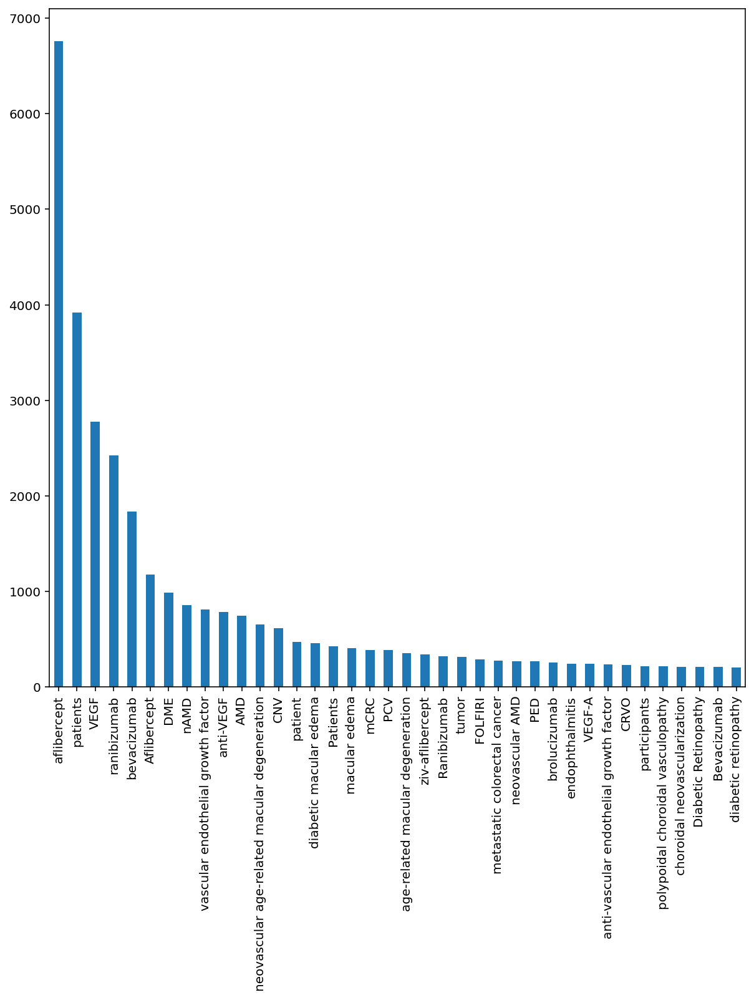

In [5]:
plt.figure(figsize=(10,10))
counts[counts >= 200].plot.bar()

# Data cleaning

Some abbs to fix it. and some mentions should be remove to overwhelming.

In [6]:
# df['mention'] = df['mention'].str.capitalize()
df['mention'] = df['mention'].replace(['vascular endothelial growth factor'],'VEGF')
df['mention'] = df['mention'].replace(['anti-vascular endothelial growth factor'],'anti-VEGF')
df['mention'] = df['mention'].replace(['diabetic retinopathy'],'Diabetic Retinopathy')
df['mention'] = df['mention'].replace(['ranibizumab'],'Ranibizumab')
df['mention'] = df['mention'].replace(['bevacizumab'],'Bevacizumab')
df['mention'] = df['mention'].replace(['neovascular age-related macular degeneration'],'nAMD')
df['mention'] = df['mention'].replace(['neovascular AMD'],'nAMD')
df['mention'] = df['mention'].replace(['age-related macular degeneration'],'AMD')
df['mention'] = df['mention'].replace(['CRVO'],'central retinal vein occlusion')
df['mention'] = df['mention'].replace(['DME'],'diabetic macular edema')

In [7]:
df.drop(df[df['mention'] == 'Aflibercept'].index, inplace=True)
df.drop(df[df['mention'] == 'aflibercept'].index, inplace=True)
df.drop(df[df['mention'] == 'VEGF'].index, inplace=True)
df.drop(df[df['mention'] == 'ascular endothelial growth factor'].index, inplace=True)
df.drop(df[df['mention'] == 'patient'].index, inplace=True)
df.drop(df[df['mention'] == 'patients'].index, inplace=True)
df.drop(df[df['mention'] == 'Patients'].index, inplace=True)
df.drop(df[df['mention'] == 'PATIENTS'].index, inplace=True)
df.drop(df[df['mention'] == 'PARTICIPANTS'].index, inplace=True)
df.drop(df[df['pmid'] == 20664824].index, inplace=True) # This article contains just lot of words

# Make edgelist

In [8]:
G = nx.from_pandas_edgelist(df, source='pmid', target='mention', edge_attr='obj')
len(G.nodes())

10196

# EDA: degree of node


In [9]:
degrees = dict(nx.degree(G))
nx.set_node_attributes(G, name='degree', values=degrees)
degree_df = pd.DataFrame(G.nodes(data='degree'), columns=['node', 'degree'])
degree_df = degree_df.sort_values(by='degree', ascending=False)
degree_df
# networkx.degree(G, weight='obj')

,node,degree
3,Ranibizumab,1014
56,Bevacizumab,869
26,nAMD,640
30,anti-VEGF,565
48,AMD,546
...,...,...
4833,hyperammonaemia,1
4832,lactic acidosis,1
4831,encephalopathy,1
4830,Hyperammonaemia,1


In [10]:
degree_df.describe()

,degree
count,10196.000000
mean,4.981954
std,19.487863
min,1.000000
25%,1.000000
50%,1.000000
75%,5.000000
max,1014.000000


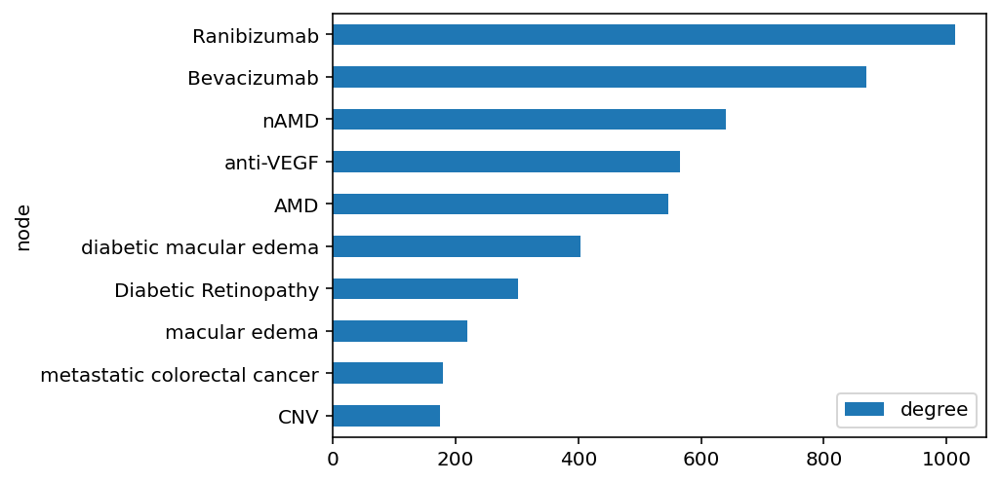

In [11]:
num_nodes_to_inspect = 10
degree_df[:num_nodes_to_inspect].plot(x='node', y='degree', kind='barh').invert_yaxis()

# EDA: centrality of node

In [12]:
betweenness_centrality = nx.betweenness_centrality(G)
nx.set_node_attributes(G, name='betweenness', values=betweenness_centrality)

betweenness_df = pd.DataFrame(G.nodes(data='betweenness'), columns=['node', 'betweenness'])
betweenness_df = betweenness_df.sort_values(by='betweenness', ascending=False)
betweenness_df.head()

,node,betweenness
56,Bevacizumab,0.329332
3,Ranibizumab,0.209127
30,anti-VEGF,0.111176
26,nAMD,0.092371
48,AMD,0.088492


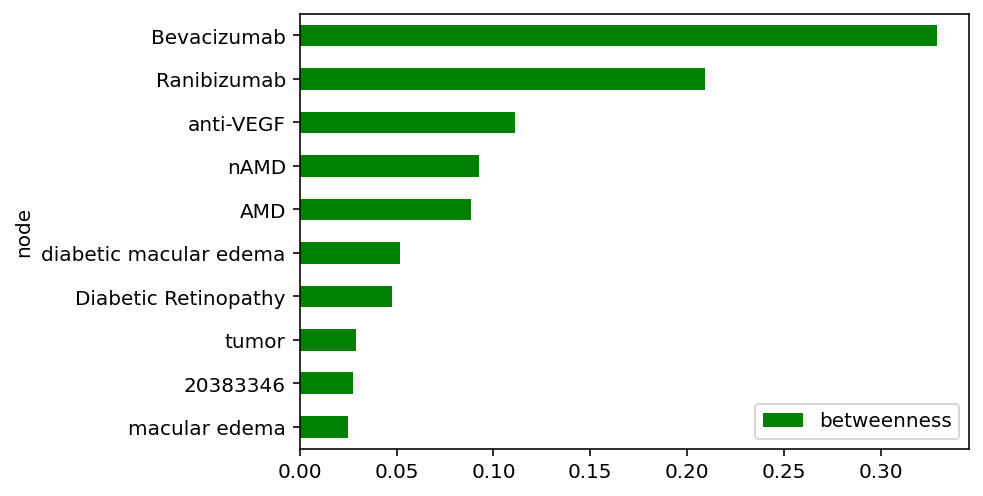

In [13]:
num_nodes_to_inspect = 10
betweenness_df[:num_nodes_to_inspect].plot(x='node', y='betweenness', color='green', kind='barh').invert_yaxis()

# EDA: degree, centrality analysis for one code.

In [14]:
nodes_df = pd.DataFrame(dict(G.nodes(data=True))).T
nodes_df.sort_values(by='betweenness', ascending=False)

,degree,betweenness
Bevacizumab,869.0,0.329332
Ranibizumab,1014.0,0.209127
anti-VEGF,565.0,0.111176
nAMD,640.0,0.092371
AMD,546.0,0.088492
...,...,...
hyperammonaemia,1.0,0.000000
lactic acidosis,1.0,0.000000
encephalopathy,1.0,0.000000
Hyperammonaemia,1.0,0.000000


# Visualization of networks

In [15]:
# largest connected component
components = nx.connected_components(G)
largest_component = max(components, key=len)
H = G.subgraph(largest_component)

# remove low-degree nodes
low_degree = [n for n, d in G.degree() if d < 5]
G.remove_nodes_from(low_degree)

# compute centrality
centrality = nx.betweenness_centrality(H, k=10, endpoints=True)

# compute community structure
lpc = nx.community.label_propagation_communities(H)
community_index = {n: i for i, com in enumerate(lpc) for n in com}

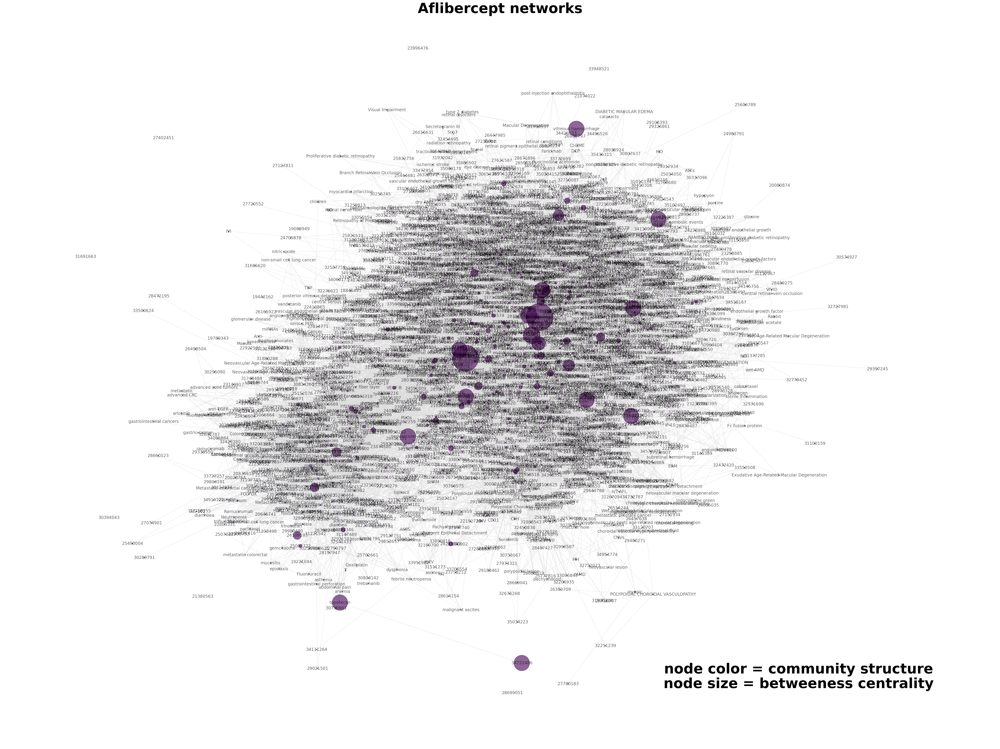

In [16]:
#### draw graph ####
fig, ax = plt.subplots(figsize=(40, 30))
pos = nx.spring_layout(H, k=0.15, seed=42)
node_color = [community_index[n] for n in H]
node_size = [v * 20000 for v in centrality.values()]
nx.draw_networkx(
    H,
    pos=pos,
    with_labels=True,
    node_color=node_color,
    node_size=node_size,
    edge_color="gainsboro",
    alpha=0.6
)

# Title/legend
font = {"color": "k", "fontweight": "bold", "fontsize": 40}
ax.set_title("Aflibercept networks", font)

# Change font color for legend
# font["color"] = "k"

ax.text(
    0.80,
    0.10,
    "node color = community structure",
    horizontalalignment="center",
    transform=ax.transAxes,
    fontdict=font,
)
ax.text(
    0.80,
    0.08,
    "node size = betweeness centrality",
    horizontalalignment="center",
    transform=ax.transAxes,
    fontdict=font,
)

# Resize figure for label readibility
ax.margins(0.1, 0.05)
fig.tight_layout()
plt.axis("off")
plt.show()

# Save the edgelist to file

In [17]:
fh = open("./output/aflibercept.edgelist", "wb")
nx.write_edgelist(G, fh)